# TF02. Clasificación de piezas mediante Deep-learning

## Autor: Martín Solano Martínez

En este trabajo desarrollaremos de una aplicación software en Python para la inspección de pequeño
material mecánico utilizando técnicas de deep-learning para la clasificación de este.

El conjunto de datos utilizado para la clasificación de piezas es el **MVTec Screws V1.0**, específicamente diseñado para la inspección visual de pequeño material mecánico.

### Fuente de datos

El dataset fue descargado de la siguiente fuente oficial:

* **Enlace de descarga:** [https://www.mvtec.com/company/research/datasets/mvtec-screws/downloads](https://www.mvtec.com/company/research/datasets/mvtec-screws/downloads)
* **Formato inicial:** El archivo se obtuvo en formato comprimido `.tar.gz`.


In [ ]:
import os

print("Directorio de trabajo actual:", os.getcwd())
print("Jerarquía de directorios:")
for root, dirs, files in os.walk("../"):
    level = root.replace(os.getcwd(), "").count(os.sep)
    indent = " " * 4 * level
    print(f"{indent}{os.path.basename(root)}/")
    subindent = " " * 4 * (level + 1)
    for f in files:
        print(f"{subindent}{f}")

Directorio de trabajo actual: /Users/martinsolano/Library/CloudStorage/OneDrive-UNIVERSIDADDEMURCIA/GCID/4º GCID/Mis trabajos/AIVA/TF/src
Jerarquía de directorios:
    /
        .DS_Store
    models/
    data/
        mvtec_screws_v1.0.tar.gz
    src/
        main.ipynb


Arriba hemos mostrado la jerarquía de directorios que hemos creado. Actualmente nos encontramos en el directorio `src` porque estamos ejecutando el archivo `main.ipynb`. Vamos a descomprimir el archivo con los datos:

In [ ]:

print("Iniciando descompresión de datos...")
!tar -xvzf ../data/mvtec_screws_v1.0.tar.gz -C ../data/
print("Descompresión completada.")

# Verificación de la estructura en la carpeta data/
print("\nContenido de la carpeta ../data/ después de la descompresión:")
!ls ../data/

Iniciando descompresión de datos...
x ./
x ./mvtec_screws_test.hdict
x ./README_v1.0.txt
x ./mvtec_screws_val.json
x ./mvtec_screws_train.hdict
x ./mvtec_screws_val.hdict
x ./mvtec_screws_test.json
x ./mvtec_screws.json
x ./mvtec_screws_splitted.hdict
x ./mvtec_screws_train.json
x ./images/
x ./images/screws_217.png
x ./images/screws_210.png
x ./images/screws_051.png
x ./images/screws_124.png
x ./images/screws_161.png
x ./images/screws_381.png
x ./images/screws_204.png
x ./images/screws_200.png

... [Contenido truncado para mejorar legibilidad] ...
images                      mvtec_screws_train.hdict
mvtec_screws.hdict          mvtec_screws_train.json
mvtec_screws.json           mvtec_screws_v1.0.tar.gz
mvtec_screws_splitted.hdict mvtec_screws_val.hdict
mvtec_screws_test.hdict     mvtec_screws_val.json


Observamos que la descompresión ha funcionado correctamente. Ahora vamos a explicar un poco la estructura que tenemos que hemos derivado de leer el fichero `README_v1.0.txt`.

## Estructura del dataset

Tras la correcta descompresión del archivo `.tar.gz`, la carpeta `data/` contiene los elementos fundamentales del dataset MVTec Screws V1.0, esenciales para nuestro proyecto:

* **`images/` (Directorio):** Contiene las 384 imágenes originales de alta resolución con múltiples piezas (tornillos, tuercas, etc.) sobre el fondo de madera.
* **`mvtec_screws_train.json` / `mvtec_screws_val.json` / `mvtec_screws_test.json` (Archivos):** Estos son los ficheros de anotaciones en formato **COCO**. Definen los conjuntos de entrenamiento, validación y prueba, proporcionando las coordenadas de los *bounding boxes* rotados (5 parámetros: centro, ancho, alto y ángulo $\phi$) para cada pieza dentro de las imágenes.
* **`mvtec_screws.json`:** Contiene todas las anotaciones sin dividir.

Mostramos a continuación la estructura de los .json:

In [ ]:

import os
import json
import pprint # Usamos pprint para una impresión más legible

# Rutas
DATA_DIR = '../data'
JSON_FILE = os.path.join(DATA_DIR, 'mvtec_screws.json')

if not os.path.exists(JSON_FILE):
    print(f"Error: El archivo JSON no se encuentra en la ruta: {JSON_FILE}")
else:
    print(f"Cargando archivo: {JSON_FILE}")
    with open(JSON_FILE, 'r') as f:
        data = json.load(f)

    print("\n 1. Claves principales del archivo JSON ")
    print(f"Claves encontradas: {list(data.keys())}")

    print("\n 2. Estructura de la lista 'images' ")
    print(f"Total de imágenes: {len(data['images'])}")
    print("Primer elemento de 'images':")
    pprint.pprint(data['images'][0])

    print("\n 3. Estructura de la lista 'annotations' ")
    print(f"Total de anotaciones (piezas): {len(data['annotations'])}")
    print("Primer elemento de 'annotations':")
    pprint.pprint(data['annotations'][0])

    print("\n 4. Estructura de la lista 'categories' ")
    print(f"Total de categorías (clases): {len(data['categories'])}")
    print("Primer elemento de 'categories':")
    pprint.pprint(data['categories'][0])

Cargando archivo: ../data/mvtec_screws.json

 1. Claves principales del archivo JSON 
Claves encontradas: ['categories', 'images', 'annotations', 'licenses', 'info']

 2. Estructura de la lista 'images' 
Total de imágenes: 384
Primer elemento de 'images':
{'file_name': 'screws_001.png',
 'height': 1440,
 'id': 1,
 'license': 1,
 'width': 1920}

 3. Estructura de la lista 'annotations' 
Total de anotaciones (piezas): 4427
Primer elemento de 'annotations':
{'area': 3440.97,
 'bbox': [184.5, 876.313, 55, 62.5631, 0],
 'category_id': 7,
 'id': 1001,
 'image_id': 1,
 'is_crowd': 0}

 4. Estructura de la lista 'categories' 
Total de categorías (clases): 13
Primer elemento de 'categories':
{'id': 1, 'name': 'type_001', 'supercategory': 'object'}


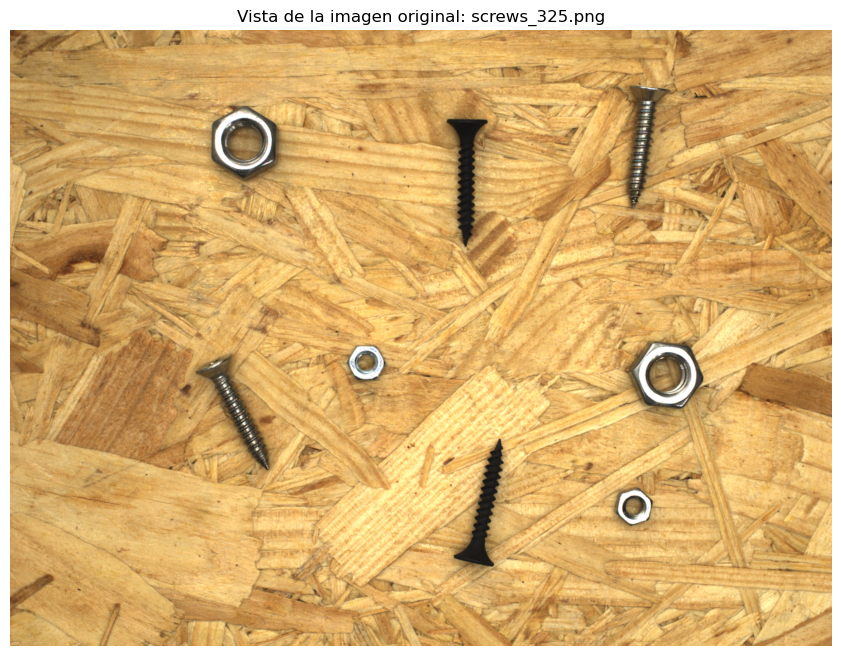

In [ ]:

import os
import cv2
import matplotlib.pyplot as plt
import random

# La ruta a la carpeta 'images' desde el notebook (que está en 'src/')
IMAGES_DIR = '../data/images'

# Obtener la lista de todos los archivos de imagen
image_files = os.listdir(IMAGES_DIR)

# Filtrar archivos ocultos (como .DS_Store en Mac)
image_files = [f for f in image_files if f.endswith('.png') or f.endswith('.jpg')]

if not image_files:
    print("Error: No se encontraron imágenes en la carpeta.")
else:
    # Seleccionar una imagen al azar
    random_filename = random.choice(image_files)
    image_path = os.path.join(IMAGES_DIR, random_filename)

    # Leer la imagen con OpenCV (lee en formato BGR)
    img_bgr = cv2.imread(image_path)

    if img_bgr is None:
        print(f"Error al cargar la imagen: {random_filename}")
    else:
        # Convertir de BGR a RGB para la correcta visualización en Matplotlib
        img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

        # Mostrar la imagen
        plt.figure(figsize=(14, 8))
        plt.imshow(img_rgb)
        plt.title(f"Vista de la imagen original: {random_filename}")
        plt.axis('off')
        plt.show()


También podríamos ver y graficar las anotaciones asociadas a esta imagen:

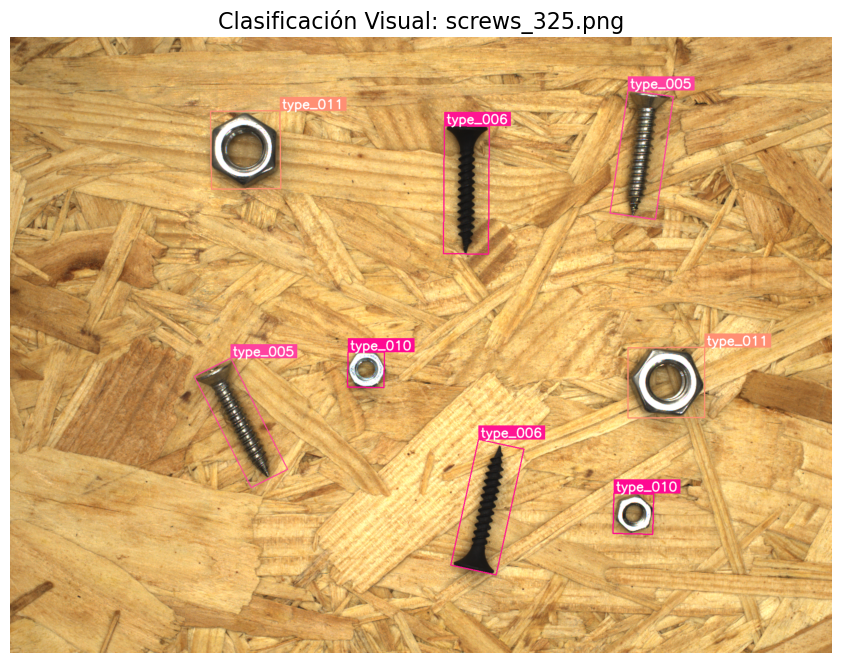

Visualizando 8 piezas rotadas en screws_325.png


In [ ]:

import os
import cv2
import json
import numpy as np
import matplotlib.pyplot as plt
import random
import math

# Rutas
DATA_DIR = '../data'
IMAGES_DIR = os.path.join(DATA_DIR, 'images')
JSON_FILE = os.path.join(DATA_DIR, 'mvtec_screws.json')

if not os.path.exists(JSON_FILE):
    print(f"Error: No se encuentra {JSON_FILE}")
else:
    with open(JSON_FILE, 'r') as f:
        data = json.load(f)

    # Mapeos para facilitar búsquedas
    image_name_to_id = {img['file_name']: img['id'] for img in data['images']}
    category_map = {cat['id']: cat['name'] for cat in data['categories']}

    # Usamos la imagen mostrada anteriormente
    image_path = os.path.join(IMAGES_DIR, random_filename)
    target_image_id = image_name_to_id.get(random_filename)

    img_bgr = cv2.imread(image_path)

    if img_bgr is not None and target_image_id is not None:
        # Filtrar anotaciones
        ann_list = [ann for ann in data['annotations'] if ann['image_id'] == target_image_id]

        img_annotated = img_bgr.copy()

        for ann in ann_list:
            # 1. Recuperar geometría
            row, col, width, height, phi = ann['bbox']
            category_name = category_map.get(ann['category_id'], '??')

            # 2. Calcular la caja rotada exacta
            center = (float(col), float(row))
            size = (float(width), float(height))
            angle_deg = math.degrees(-float(phi)) # Invertir signo para corregir orientación

            rect = (center, size, angle_deg)
            box_points = cv2.boxPoints(rect)
            box_points = np.intp(box_points) # Convertir a enteros

            # Generar color único por categoría (usando hash para consistencia)
            random.seed(ann['category_id'])
            color = (random.randint(0, 180), random.randint(0, 180), 255) # Rojos/Azules brillantes

            # 3. Dibujar contorno de la pieza (Grosor 2)
            cv2.drawContours(img_annotated, [box_points], 0, color, 2)

            # 4. Buscar el punto más alto de la caja rotada
            # Ordenamos los puntos por coordenada Y (altura)
            # El punto con menor Y es el más alto en la imagen
            highest_point_idx = np.argmin(box_points[:, 1])
            text_anchor_x, text_anchor_y = box_points[highest_point_idx]

            # Configuración de fuente
            font = cv2.FONT_HERSHEY_SIMPLEX
            font_scale = 1
            thickness = 2
            (text_w, text_h), baseline = cv2.getTextSize(category_name, font, font_scale, thickness)

            # 5. Dibujar fondo para el texto (Etiqueta sólida)
            # Calculamos coordenadas para que la etiqueta quede justo encima del punto más alto
            # Ajustamos límites para que no se salga de la imagen por arriba
            rect_x1 = max(0, text_anchor_x)
            rect_y1 = max(0, text_anchor_y - text_h - 10)
            rect_x2 = rect_x1 + text_w + 10
            rect_y2 = rect_y1 + text_h + 10

            # Rectángulo relleno detrás del texto
            cv2.rectangle(img_annotated, (rect_x1, rect_y1), (rect_x2, rect_y2), color, -1)

            # 6. Escribir texto (blanco para contraste)
            cv2.putText(img_annotated, category_name,
                        (rect_x1 + 5, rect_y2 - 5), # Un pequeño margen interno
                        font, font_scale, (255, 255, 255), thickness, cv2.LINE_AA)

        # Mostrar resultado
        img_rgb = cv2.cvtColor(img_annotated, cv2.COLOR_BGR2RGB)
        plt.figure(figsize=(14, 8))
        plt.imshow(img_rgb)
        plt.title(f"Clasificación Visual: {random_filename}", fontsize=16)
        plt.axis('off')
        plt.show()

        print(f"Visualizando {len(ann_list)} piezas rotadas en {random_filename}")

Ahora que ya entendemos perfectamente cómo funciona el conjunto de datos, vamos a pasar a preparar nuestro conjunto de entrenamiento. Para ello, necesitamos transformar la naturaleza del dataset original, pasando de un formato orientado a la detección de objetos (donde una imagen contiene múltiples piezas y coordenadas) a uno optimizado para la clasificación de imágenes (donde cada imagen contiene una única pieza).

Este proceso es crítico para poder alimentar correctamente a la red neuronal en las etapas posteriores.

### Estrategia de preprocesamiento

El procedimiento que implementaremos mediante código realizará las siguientes tareas automatizadas:

* **Lectura de metadatos:** Iterar sobre los archivos JSON (`train`, `val`, `test`) para recuperar las coordenadas exactas ($row, col, width, height$) y la etiqueta de clase de cada pieza.
* **Extracción de imágenes:** Utilizar las coordenadas del *Bounding Box* para recortar digitalmente la región de la imagen original que contiene exclusivamente la pieza mecánica.
* **Organización jerárquica:** Almacenar cada recorte en una nueva estructura de directorios estandarizada, compatible con los generadores de datos de librerías como TensorFlow/Keras (`ImageDataGenerator`).

### Estructura de directorios objetivo

El objetivo final de este paso es generar una nueva carpeta `processed/` con la siguiente jerarquía, que permitirá al modelo aprender las características de cada clase de forma supervisada:

```text
data/processed/
├── train/                  # Datos de Entrenamiento (~70%)
│   ├── type_001/           # Todas las imágenes recortadas del primer tipo de material mecánico
│   ├── type_002/           # Todas las imágenes recortadas del segundo tipo de material mecánico
│   ├── ...                 # Resto de las 13 clases
├── val/                    # Datos de Validación (~15%)
│   ├── type_001/
│   └── ...
└── test/                   # Datos de Prueba (~15%)
    ├── type_001/
    └── ...

In [ ]:

import json
import os
import cv2
import numpy as np
import math
import time

# Rutas relativas desde 'src/'
DATA_DIR = '../data'
IMAGES_DIR = os.path.join(DATA_DIR, 'images')
OUTPUT_DIR = os.path.join(DATA_DIR, 'processed')

# Archivos de anotaciones por conjunto
JSON_FILES = {
    'train': os.path.join(DATA_DIR, 'mvtec_screws_train.json'),
    'val':   os.path.join(DATA_DIR, 'mvtec_screws_val.json'),
    'test':  os.path.join(DATA_DIR, 'mvtec_screws_test.json')
}

# Función para recortar la pieza según la caja rotada
def obtener_recorte_pieza(imagen, bbox):
    """
    Calcula el rectángulo envolvente recto de una caja rotada
    y recorta la imagen asegurando que la pieza entera quede dentro.
    """
    # Desempaquetar formato MVTec: centro_fila, centro_columna, ancho, alto, ángulo(rad)
    row, col, width, height, phi = bbox

    # Conversión a formato geométrico (x, y)
    center = (float(col), float(row))
    size = (float(width), float(height))
    angle_deg = math.degrees(-float(phi)) # Corregimos el signo del ángulo

    # Obtener los 4 vértices del rectángulo rotado
    rect = (center, size, angle_deg)
    box_points = cv2.boxPoints(rect)
    box_points = np.intp(box_points)

    # Calcular el rectángulo que envuelve a la caja rotada
    x, y, w, h = cv2.boundingRect(box_points)

    # Asegurar límites para no salirnos de la imagen (padding seguro)
    y = max(0, y)
    x = max(0, x)
    h = min(h, imagen.shape[0] - y)
    w = min(w, imagen.shape[1] - x)

    # Devolver el recorte
    return imagen[y:y+h, x:x+w]

# Procesamiento de cada archivo JSON
def procesar_json(split_name, json_path):
    print(f"\n--- Procesando conjunto: {split_name.upper()} ---")

    if not os.path.exists(json_path):
        print(f"Error: No encontrado {json_path}")
        return

    with open(json_path, 'r') as f:
        data = json.load(f)

    # Mapeos para acceso rápido
    categories_map = {cat['id']: cat['name'] for cat in data['categories']}
    images_map = {img['id']: img['file_name'] for img in data['images']}

    count = 0
    total_anns = len(data['annotations'])
    start_time = time.time()

    # Iterar sobre cada anotación (cada pieza individual)
    for i, ann in enumerate(data['annotations']):

        # Recuperar datos
        img_filename = images_map[ann['image_id']]
        category_name = categories_map[ann['category_id']]
        bbox = ann['bbox']

        # Cargar imagen original
        img_path = os.path.join(IMAGES_DIR, img_filename)
        img = cv2.imread(img_path)

        if img is None:
            continue

        # Crear estructura de carpetas: processed/train/type_0xx/
        class_dir = os.path.join(OUTPUT_DIR, split_name, category_name)
        os.makedirs(class_dir, exist_ok=True)

        # Realizar el recorte
        recorte = obtener_recorte_pieza(img, bbox)

        # Guardar si el recorte es válido
        if recorte.size > 0:
            save_name = f"{ann['image_id']}_{ann['id']}.png" # ID_Imagen + ID_Anotacion
            save_path = os.path.join(class_dir, save_name)
            cv2.imwrite(save_path, recorte)
            count += 1

        # Mostrar progreso cada 200 piezas
        if i % 200 == 0:
            print(f"  -> Progreso: {i}/{total_anns} piezas procesadas...", end='\r')

    print(f"\nFinalizado {split_name}: {count} imágenes generadas.")


In [ ]:

print(f"Iniciando la transformación del dataset...")
print(f"Directorio de destino: {os.path.abspath(OUTPUT_DIR)}")

# Crear directorio base
os.makedirs(OUTPUT_DIR, exist_ok=True)

# Procesar train, val y test
for split, path in JSON_FILES.items():
    procesar_json(split, path)

print("\nProceso completado. El dataset está listo en la carpeta 'processed'.")

Iniciando la transformación del dataset...
Directorio de destino: /Users/martinsolano/Library/CloudStorage/OneDrive-UNIVERSIDADDEMURCIA/GCID/4º GCID/Mis trabajos/AIVA/TF/data/processed

--- Procesando conjunto: TRAIN ---
  -> Progreso: 3000/3119 piezas procesadas...
Finalizado train: 3119 imágenes generadas.

--- Procesando conjunto: VAL ---
  -> Progreso: 600/647 piezas procesadas...
Finalizado val: 647 imágenes generadas.

--- Procesando conjunto: TEST ---
  -> Progreso: 600/661 piezas procesadas...
Finalizado test: 661 imágenes generadas.

Proceso completado. El dataset está listo en la carpeta 'processed'.


Ahora podemos ver algunos ejemplos de nuestro dataset procesado:

Visualizando 5 ejemplos para cada una de las 13 clases.


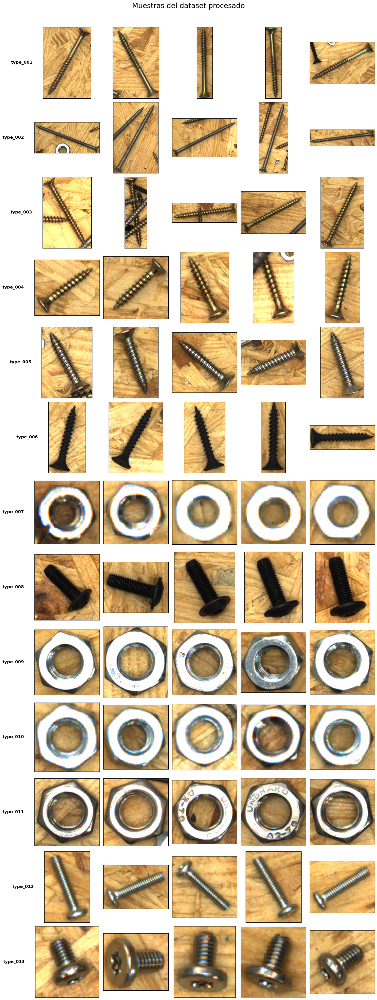

In [ ]:

import matplotlib.pyplot as plt
import os
import cv2
import random

# Rutas
PROCESSED_DIR = '../data/processed/train' # Usamos el set de entrenamiento para visualizar
SAMPLES_PER_CLASS = 5 # Cuántos ejemplos mostrar por fila

# Obtener lista de clases (carpetas), ignorando archivos ocultos (.DS_Store)
classes = sorted([d for d in os.listdir(PROCESSED_DIR)
                  if os.path.isdir(os.path.join(PROCESSED_DIR, d)) and not d.startswith('.')])

num_classes = len(classes)
print(f"Visualizando {SAMPLES_PER_CLASS} ejemplos para cada una de las {num_classes} clases.")

fig, axes = plt.subplots(nrows=num_classes, ncols=SAMPLES_PER_CLASS, figsize=(15, 3 * num_classes))

fig.suptitle('Muestras del dataset procesado', fontsize=20, y=1.01)

# Iterar sobre clases y columnas
for i, class_name in enumerate(classes):
    class_path = os.path.join(PROCESSED_DIR, class_name)

    # Obtener todas las imágenes de esa clase
    all_images = [f for f in os.listdir(class_path) if f.endswith('.png')]

    # Seleccionar N imágenes al azar (o menos si no hay suficientes)
    selected_images = random.sample(all_images, min(len(all_images), SAMPLES_PER_CLASS))

    for j, img_name in enumerate(selected_images):
        img_path = os.path.join(class_path, img_name)
        img = cv2.imread(img_path)

        ax = axes[i, j]

        if img is not None:
            # Convertir BGR a RGB
            img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            ax.imshow(img_rgb)

        ax.set_xticks([])
        ax.set_yticks([])

        # Poner el nombre de la clase SOLO en la primera columna de cada fila
        if j == 0:
            ax.set_ylabel(class_name, rotation=0, labelpad=60, fontsize=12, fontweight='bold', va='center')

plt.tight_layout()
plt.show()

Una vez finalizado y verificado el preprocesamiento de las imágenes, procedemos a la fase de entrenamiento del modelo.

Debido a la alta carga computacional que requiere el entrenamiento de redes neuronales profundas (Deep Learning), utilizaremos el entorno de **Google Colab**. Esta plataforma nos permite acceso gratuito a una **GPU NVIDIA T4**, lo que acelerará drásticamente el proceso de cálculo de gradientes y *backpropagation* en comparación con una CPU estándar.

Para ello, el siguiente paso técnico consiste en recuperar nuestro dataset procesado. Descargaremos el archivo `.zip` que contiene la estructura de directorios (`train`, `val`, `test` con sus respectivas clases) que hemos comprimido y almacenado previamente en Google Drive.

In [ ]:

import tensorflow as tf

# Muestra el nombre de la GPU que está usando Colab (debe ser NVIDIA T4)
gpu_list = tf.config.experimental.list_physical_devices('GPU')

if gpu_list:
    print("¡GPU detectada y activa!")
    for gpu in gpu_list:
        print(f"   -> Nombre del dispositivo: {gpu.name}")
        print(f"   -> Tipo de dispositivo: {tf.config.experimental.get_device_details(gpu)['device_name']}")
    print("\nTensorFlow está utilizando la GPU para el entrenamiento.")
else:
    print("¡Advertencia! No se detectó ninguna GPU.")
    print("Revisa la configuración del entorno de ejecución de Colab.")

# Información adicional sobre el dispositivo
!nvidia-smi

¡GPU detectada y activa!
   -> Nombre del dispositivo: /physical_device:GPU:0
   -> Tipo de dispositivo: Tesla T4

TensorFlow está utilizando la GPU para el entrenamiento.
Sun Dec 14 19:19:41 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   43C    P8              9W /   70W |       2MiB /  15

In [ ]:

import os
import time
from google.colab import drive

# Montamos el directorio de drive
drive.mount('/content/drive')

DRIVE_ZIP_PATH = '/content/drive/MyDrive/TF_AIVA/processed.zip'
TARGET_DIR = '/content/data' # Directorio donde se descomprimirán los datos

# Crear la carpeta de destino
os.makedirs(TARGET_DIR, exist_ok=True)
print(f"Directorio de destino: {TARGET_DIR}")

# Descomprimimos el directorio
!unzip -q "{DRIVE_ZIP_PATH}" -d "{TARGET_DIR}"

# Comprobamos que se haya descomprimido correctamente
print("\nContenido del directorio 'processed/':")
!ls -la /content/data/processed/

Mounted at /content/drive
Directorio de destino: /content/data

Contenido del directorio 'processed/':
total 20
drwxr-xr-x  5 root root 4096 Dec 13 12:30 .
drwxr-xr-x  3 root root 4096 Jan  7 20:06 ..
drwxr-xr-x 15 root root 4096 Dec 13 12:30 test
drwxr-xr-x 15 root root 4096 Dec 13 12:23 train
drwxr-xr-x 15 root root 4096 Dec 13 12:29 val


Para acelerar el entrenamiento y beneficiarnos del conocimiento adquirido previamente en un gran conjunto de datos (ImageNet), implementaremos la técnica de **Transfer Learning**.

Utilizaremos la arquitectura **MobileNetV2**, elegida por su eficiencia en dispositivos con recursos limitados (como nuestra GPU T4 o entornos de despliegue ligeros).

El proceso que seguiremos es:

1.  **Descarga del modelo base:** Descargaremos la arquitectura MobileNetV2 pre-entrenada con los pesos de ImageNet.
2.  **Congelación de capas:** Congelaremos todas las capas convolucionales del modelo base. Esto asegura que solo las capas superiores (la "cabeza" de clasificación que añadiremos) se entrenen inicialmente.
3.  **Preparación del directorio:** Guardaremos los pesos del modelo en el directorio `models/` para mantener limpio el espacio de trabajo.

In [ ]:

import os
import tensorflow as tf
from tensorflow.keras.applications import MobileNetV2

# Creamos la carpeta 'models' en el directorio raíz de Colab (/content/)
MODELS_DIR = '/content/models'
os.makedirs(MODELS_DIR, exist_ok=True)

# Configuramos la descarga del modelo base
# No necesitamos la capa de clasificación superior (include_top=False)
# y queremos que use los pesos entrenados en ImageNet.

# Descargar y guardar el modelo en formato Keras (que incluye la arquitectura y los pesos)
try:
    INPUT_SHAPE = (224, 224, 3)

    # Creamos la instancia de MobileNetV2 (sin las capas finales de clasificación)
    base_model = MobileNetV2(
        weights='imagenet',
        include_top=False,
        input_shape=INPUT_SHAPE
    )

    # Guardamos el modelo descargado en el directorio 'models/'
    MODEL_FILENAME = os.path.join(MODELS_DIR, 'mobilenet_v2_imagenet.keras')
    base_model.save(MODEL_FILENAME)

    print(f"MobileNetV2 guardado exitosamente en: {MODEL_FILENAME}")

except Exception as e:
    print(f"Error al descargar o guardar el modelo: {e}")

# Verificamos el contenido del directorio
print("\nContenido del directorio 'models/':")
!ls -lh {MODELS_DIR}

9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
MobileNetV2 guardado exitosamente en: /content/models/mobilenet_v2_imagenet.keras

Contenido del directorio 'models/':
total 9.2M
-rw-r--r-- 1 root root 9.2M Dec 15 11:19 mobilenet_v2_imagenet.keras


El **Transfer Learning** es la piedra angular de esta fase. Consiste en reutilizar el cuerpo (las capas convolucionales) de un modelo pre-entrenado en un dataset masivo (como ImageNet) y adaptarlo para nuestra tarea específica de clasificación de piezas mecánicas.

Este enfoque nos permite obtener un rendimiento alto con menos datos y un tiempo de entrenamiento mucho menor, ya que las capas iniciales de MobileNetV2 ya han aprendido a reconocer características visuales genéricas como bordes, texturas y formas.

### Estrategia de configuración

Implementaremos la siguiente estrategia en la construcción del modelo:

1.  **Modelo base inmutable:** Cargaremos el modelo MobileNetV2 descargado, pero **congelaremos** (`trainable=False`) todas sus capas convolucionales. Esto significa que sus pesos no serán modificados durante la primera fase del entrenamiento.
2.  **Nueva cabeza de clasificación:** Adjuntaremos una serie de nuevas capas ("cabeza" o *top layers*) a la salida del modelo base. Esta cabeza consiste en:
    * `GlobalAveragePooling2D`: Reduce las características convolucionales a un vector.
    * `Dense` + `Dropout`: Capas densas para aprender las combinaciones de características de alto nivel.
    * **Capa de salida:** Una capa `Dense` con activación `softmax` que tendrá exactamente **el número de neuronas igual al número de clases** (13 tipos de piezas). Esta es la única parte que inicialmente aprenderá a clasificar nuestros pequeño material mecánico.
3.  **Compilación:** Compilaremos el modelo utilizando el optimizador **Adam** con una tasa de aprendizaje baja ($1e-4$) y la función de pérdida `categorical_crossentropy`.

Para entrenar nuestra red neuronal de manera eficiente y robusta, no cargaremos todas las imágenes directamente en la memoria RAM. En su lugar, utilizaremos generadores de datos (`ImageDataGenerator` de Keras/TensorFlow) que realizarán tres tareas críticas en tiempo real durante el entrenamiento:

1.  **Preprocesamiento Específico:** Adaptar los valores de los píxeles al rango que espera la red neuronal **MobileNetV2**. En este caso, normalizaremos los valores al rango `[-1, 1]`.
2.  **Redimensionamiento (Resizing):** Aunque nuestros recortes tienen tamaños variados, las redes neuronales convolucionales requieren una entrada de dimensiones fijas. Ajustaremos todas las imágenes a **224x224 píxeles**.
3.  **Aumento de Datos (Data Augmentation):** Dado que estamos trabajando con un dataset finito, aplicaremos transformaciones aleatorias (rotaciones, ligeros desplazamientos y zoom) a las imágenes de entrenamiento. Esto simulará variaciones en la posición de las piezas sobre la cinta transportadora y ayudará a prevenir el *overfitting* (sobreajuste), obligando al modelo a aprender características estructurales y no solo a memorizar las fotos exactas.

A continuación, definiremos los hiperparámetros de carga (tamaño de lote o *batch size*) y configuraremos los generadores para los conjuntos de entrenamiento y validación.

In [ ]:

import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import Model, load_model
import os

# Rutas
PROCESSED_DIR = '/content/data/processed' # Ruta donde se descomprimió el dataset
TRAIN_PATH = os.path.join(PROCESSED_DIR, 'train')

IMG_SIZE = (224, 224)
BATCH_SIZE = 32
LEARNING_RATE = 1e-4 # Tasa de aprendizaje baja para ajustar las últimas capas

# Contar automáticamente el número de clases
try:
    TARGET_CLASSES = len([d for d in os.listdir(TRAIN_PATH) if os.path.isdir(os.path.join(TRAIN_PATH, d))])
    print(f"Número de clases detectadas automáticamente: {TARGET_CLASSES}")
except FileNotFoundError:
    print("Error: El directorio de entrenamiento no se encontró. Asegúrate de haber descomprimido los datos correctamente.")
    # Usar un valor por defecto si falla la detección
    TARGET_CLASSES = 13


# Creamos los DataGenerators que Keras usará para cargar lotes de imágenes
# El preprocesamiento debe ser el específico de MobileNetV2
preprocess_func = tf.keras.applications.mobilenet_v2.preprocess_input

# Generador de entrenamiento. Incluye data augmentation
train_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_func,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

# Generador de validación: Sólo preprocesamiento (sin data augmentation)
val_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_func
)

# Creación del generador de entrenamiento
train_generator = train_datagen.flow_from_directory(
    TRAIN_PATH,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=True
)

# Creación del generador de validación
validation_generator = val_datagen.flow_from_directory(
    os.path.join(PROCESSED_DIR, 'val'),
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False
)


# Construcción y compilación del modelo

# Cargamos el modelo base pre-entrenado
print(f"Cargando MobileNetV2 desde el disco local: {MODEL_FILENAME}")
try:
    # Usamos load_model para cargar el modelo previamente guardado
    base_model = load_model(MODEL_FILENAME, compile=False)
except Exception as e:
    print(f"Error al cargar el modelo. Error: {e}")
    # Si falla la carga, volvemos a descargarlo como alternativa de emergencia
    base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Congelamos las capas convolucionales base (extractor de características)
base_model.trainable = False

# Construimos la cabeza de clasificación
x = base_model.output
x = GlobalAveragePooling2D()(x) # Aplanar las características
x = Dense(512, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(TARGET_CLASSES, activation='softmax')(x) # Capa final con tantas neuronas como clases

# Creamos el modelo final
model = Model(inputs=base_model.input, outputs=predictions)

# Compilación del modelo
model.compile(
    optimizer=Adam(learning_rate=LEARNING_RATE),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

print("\nResumen del modelo:")
model.summary()

Número de clases detectadas automáticamente: 13
Found 3119 images belonging to 13 classes.
Found 647 images belonging to 13 classes.
Cargando MobileNetV2 desde el disco local: /content/models/mobilenet_v2_imagenet.keras

Resumen del modelo:


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 112, 112,  │        864 │ input_layer[0][0] │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 112, 112,  │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 112, 112,  │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 112, 112,  │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 112, 112,  │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 112, 112,  │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 112, 112,  │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 112, 112,  │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 113, 113,  │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 56, 56,    │        864 │ block_1_pad[0][0] │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 56, 56,    │        384 │ block_1_depthwis… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 56, 56,    │          0 │ block_1_depthwis… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_project     │ (None, 56, 56,    │      2,304 │ block_1_depthwis

 Total params: 2,920,525 (11.14 MB)

 Trainable params: 662,541 (2.53 MB)

 Non-trainable params: 2,257,984 (8.61 MB)

Con el modelo MobileNetV2 configurado, sus capas convolucionales congeladas y los generadores de datos listos para alimentar los lotes preprocesados y aumentados, podemos iniciar el entrenamiento.

Utilizaremos el conjunto de validación (`validation_generator`) para monitorizar el rendimiento del modelo en datos no vistos durante el entrenamiento y detectar el sobreajuste.

Definiremos un número fijo de épocas y utilizaremos un *Callback* para guardar automáticamente la mejor versión del modelo (basada en la métrica de validación).

In [ ]:

import os
import tensorflow as tf
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

# Rutas
MODELS_DIR = '/content/models'
BEST_MODEL_PATH = os.path.join(MODELS_DIR, 'best_screws_classifier.keras')

# Definimos el número de épocas y el paso por época
EPOCHS = 50 # Ponemos un número alto de épocas, ya que tenemos early stopping
            # y además guardamos el mejor modelo en memoria

# Guardamos el modelo cada vez que la métrica de validación mejore
checkpoint_callback = ModelCheckpoint(
    filepath=BEST_MODEL_PATH,
    monitor='val_accuracy', # La métrica que queremos maximizar
    mode='max',
    save_best_only=True,
    verbose=1
)

# Detenemos el entrenamiento si no hay mejora después de N épocas
early_stopping_callback = EarlyStopping(
    monitor='val_loss',
    patience=10, # Esperar 10 épocas sin mejora en la pérdida de validación
    mode='min',
    verbose=1
)

print(f"Iniciando entrenamiento por {EPOCHS} épocas...")
print(f"El mejor modelo se guardará en: {BEST_MODEL_PATH}")

# La función .fit() utiliza los generadores para alimentar los datos
history = model.fit(
    train_generator,
    epochs=EPOCHS,
    validation_data=validation_generator,
    callbacks=[checkpoint_callback, early_stopping_callback]
)

print("\nEntrenamiento finalizado")
# Una vez finalizado, el modelo guardado en 'best_screws_classifier.h5' es la mejor versión.

Iniciando entrenamiento por 50 épocas...
El mejor modelo se guardará en: /content/models/best_screws_classifier.keras
Epoch 1/50
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 505ms/step - accuracy: 0.3398 - loss: 2.1533
Epoch 1: val_accuracy improved from -inf to 0.83308, saving model to /content/models/best_screws_classifier.keras
98/98 ━━━━━━━━━━━━━━━━━━━━ 77s 689ms/step - accuracy: 0.3416 - loss: 2.1467 - val_accuracy: 0.8331 - val_loss: 0.6463
Epoch 2/50
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step - accuracy: 0.7843 - loss: 0.6671
Epoch 2: val_accuracy improved from 0.83308 to 0.88408, saving model to /content/models/best_screws_classifier.keras
98/98 ━━━━━━━━━━━━━━━━━━━━ 48s 493ms/step - accuracy: 0.7846 - loss: 0.6663 - val_accuracy: 0.8841 - val_loss: 0.4139
Epoch 3/50
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step - accuracy: 0.8592 - loss: 0.4493
Epoch 3: val_accuracy improved from 0.88408 to 0.89954, saving model to /content/models/best_screws_classifier.keras
98/98 ━━━━━━━━━━━━━━━━━━━━ 46s 469ms/ste

In [ ]:
import os
import shutil

# Rutas
SOURCE_DIR = '/content/models'
DRIVE_DEST_DIR = '/content/drive/MyDrive/TF_AIVA/models'

print(f"Iniciando respaldo de: {SOURCE_DIR}")
print(f"Hacia Google Drive:  {DRIVE_DEST_DIR}")

# Creamos el directorio en Drive si no existe
if not os.path.exists(DRIVE_DEST_DIR):
    os.makedirs(DRIVE_DEST_DIR)
    print(f"Directorio creado en Drive: {DRIVE_DEST_DIR}")

# Copiamos todos los archivos de la carpeta models
try:
    files = os.listdir(SOURCE_DIR)
    for filename in files:
        source_file = os.path.join(SOURCE_DIR, filename)
        dest_file = os.path.join(DRIVE_DEST_DIR, filename)

        # Solo copiamos si es un archivo
        if os.path.isfile(source_file):
            shutil.copy2(source_file, dest_file) # copy2 preserva fecha y hora original
            print(f"Copiado exitosamente: {filename}")

    print("\n¡Copia de seguridad completada! Tus modelos están seguros en Drive.")

except Exception as e:
    print(f"\nError al copiar los archivos: {e}")

Iniciando respaldo de: /content/models
Hacia Google Drive:  /content/drive/MyDrive/TF_AIVA/models
Directorio creado en Drive: /content/drive/MyDrive/TF_AIVA/models
Copiado exitosamente: best_screws_classifier.keras
Copiado exitosamente: mobilenet_v2_imagenet.keras

¡Copia de seguridad completada! Tus modelos están seguros en Drive.


Una vez finalizado el entrenamiento, es fundamental no solo quedarse con el valor final de precisión, sino analizar cómo ha aprendido el modelo a lo largo de las épocas.

Generaremos dos gráficas comparativas entre el conjunto de **entrenamiento** (train) y el de **validación** (val):

- **Precisión (accuracy):** Muestra el porcentaje de aciertos. Buscamos que ambas líneas crezcan y se mantengan cercanas. Si la línea de entrenamiento sigue subiendo mientras la de validación se estanca o baja, es síntoma de **overfitting** (memorización de datos).
- **Pérdida (loss):** Representa el error en la predicción (usando *categorical crossentropy*). Buscamos que tienda a cero de forma estable.

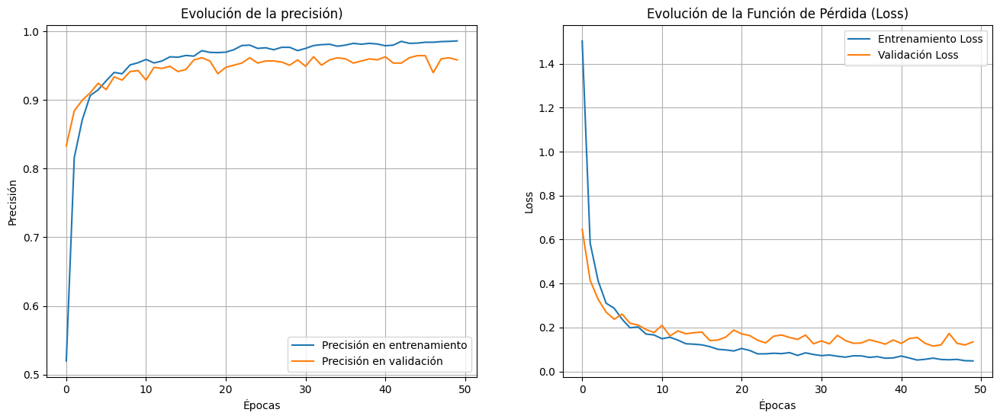

In [ ]:

import matplotlib.pyplot as plt

def graficar_entrenamiento(historia):
    acc = historia.history['accuracy']
    val_acc = historia.history['val_accuracy']
    loss = historia.history['loss']
    val_loss = historia.history['val_loss']

    epochs_range = range(len(acc))

    plt.figure(figsize=(16, 6))

    # Gráfica de precisión
    plt.subplot(1, 2, 1)
    plt.plot(epochs_range, acc, label='Precisión en entrenamiento')
    plt.plot(epochs_range, val_acc, label='Precisión en validación')
    plt.legend(loc='lower right')
    plt.title('Evolución de la precisión')
    plt.xlabel('Épocas')
    plt.ylabel('Precisión')
    plt.grid(True)

    # Gráfica de pérdida
    plt.subplot(1, 2, 2)
    plt.plot(epochs_range, loss, label='Entrenamiento Loss')
    plt.plot(epochs_range, val_loss, label='Validación Loss')
    plt.legend(loc='upper right')
    plt.title('Evolución de la función de pérdida')
    plt.xlabel('Épocas')
    plt.ylabel('Loss')
    plt.grid(True)

    plt.show()

# Llamamos a la función con el objeto 'history' obtenido en la celda anterior
if 'history' in locals():
    graficar_entrenamiento(history)
else:
    print("Error: No se encontró la variable 'history'. Ejecuta el entrenamiento primero.")


Las gráficas resultantes muestran la evolución de las métricas de precisión y pérdida a lo largo de las 50 épocas de entrenamiento. A continuación, interpretamos el comportamiento del modelo:

### 1. Evolución de la precisión
* **Convergencia rápida:** Se observa un ascenso muy pronunciado en las primeras 5-8 épocas. Esto es característico del **Transfer Learning**: al utilizar MobileNetV2 con pesos pre-entrenados en ImageNet, la red ya "sabe ver" características básicas, por lo que solo necesita adaptarse ligeramente a nuestras clases de tornillos y tuercas.
* **Rendimiento final:**
    * **Entrenamiento:** Alcanza valores cercanos al **99%**.
    * **Validación:** Se estabiliza en torno al **95-96%**.
* **Comportamiento inicial:** Curiosamente, en las primeras épocas, la validación parece tener mejor rendimiento que el entrenamiento. Esto es normal cuando se usa **Data Augmentation** y **Dropout** en el set de entrenamiento (haciendo que sea "difícil" de aprender), mientras que el set de validación consiste en imágenes limpias y directas.

### 2. Evolución de la función de pérdida
* **Descenso estable:** Ambas curvas descienden rápidamente y tienden a cero, lo que confirma que la red está aprendiendo y minimizando el error de clasificación.
* **Generalización vs. memorización:**
    * A partir de la época 15-20, la pérdida de validación (naranja) se aplana (se mantiene estable alrededor de 0.15), mientras que la de entrenamiento (azul) sigue bajando.
    * La separación entre ambas líneas (el *gap*) indica un **ligero overfitting**, lo cual es esperable en una red profunda. Sin embargo, dado que la línea naranja no vuelve a subir drásticamente, confirmamos que el `EarlyStopping` y el `Dropout` han funcionado correctamente, evitando que el modelo degenere.

### Conclusión del entrenamiento
El modelo ha sido entrenado con éxito. Hemos logrado una **exactitud de validación superior al 95%**, lo cual es un resultado excelente para una aplicación industrial de clasificación de 13 clases.

## Evaluación final del modelo

Una vez finalizado el entrenamiento y verificado que las curvas de aprendizaje son satisfactorias, procedemos a la evaluación final.

Es crucial distinguir entre el conjunto de validación (usado durante el entrenamiento para ajustar hiperparámetros y detener el proceso) y el conjunto de test. Este último representa datos totalmente nuevos para la red neuronal, simulando cómo se comportaría el sistema en la cinta transportadora real de la fábrica.

### Metodología de evaluación
Para este análisis forense del modelo, realizaremos los siguientes pasos:

1.  **Carga del mejor modelo:** Recuperaremos del disco el archivo `.keras` que obtuvo la mejor puntuación durante el entrenamiento, ignorando la última época si esta no fue la óptima.
2.  **Predicción sobre test:** Pasaremos las imágenes del directorio `test/` por el modelo. Es vital que este generador **no baraje (shuffle=False)** las imágenes, para poder alinear correctamente las predicciones con sus etiquetas reales.
3.  **Métricas industriales:**
    * **Reporte de clasificación:** Generaremos una tabla con *Precision*, *Recall* y *F1-Score* para cada una de las 13 clases.
    * **Matriz de confusión:** Visualizaremos los aciertos y errores en un mapa de calor. Esto nos permitirá detectar patrones de error específicos (ej: ¿confunde la red pequeño material mecánico de tipo 5 con uno de tipo 6?).

Cargando el mejor modelo desde: /content/models/best_screws_classifier.keras ...
Found 661 images belonging to 13 classes.
Realizando predicciones sobre el conjunto de test...


/usr/local/lib/python3.12/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


21/21 ━━━━━━━━━━━━━━━━━━━━ 28s 671ms/step

REPORTE DE CLASIFICACIÓN
              precision    recall  f1-score   support

    type_001       0.94      1.00      0.97        47
    type_002       1.00      0.98      0.99        48
    type_003       1.00      0.96      0.98        49
    type_004       0.92      1.00      0.96        48
    type_005       0.96      0.93      0.95        59
    type_006       1.00      0.95      0.98        63
    type_007       0.92      1.00      0.96        55
    type_008       1.00      1.00      1.00        55
    type_009       1.00      1.00      1.00        45
    type_010       1.00      0.90      0.95        51
    type_011       1.00      1.00      1.00        51
    type_012       0.98      0.98      0.98        45
    type_013       0.98      1.00      0.99        45

    accuracy                           0.98       661
   macro avg       0.98      0.98      0.98       661
weighted avg       0.98      0.98      0.98       661

Generando m

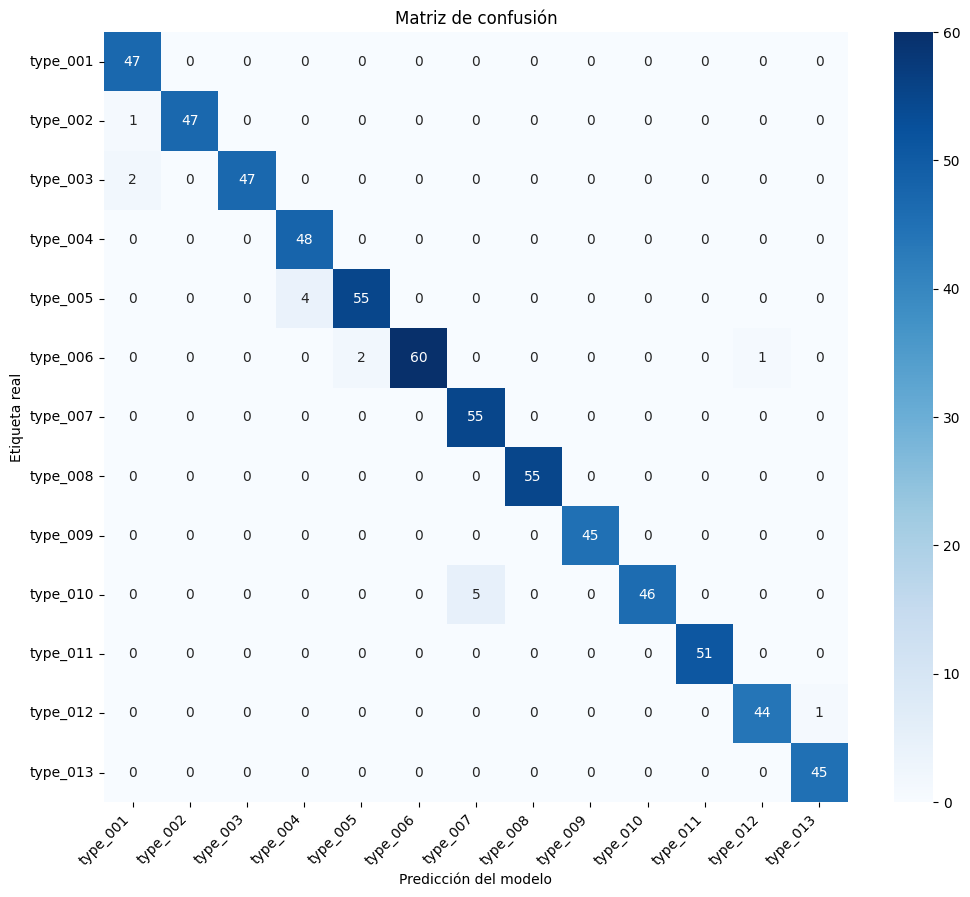

In [ ]:

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
from sklearn.metrics import classification_report, confusion_matrix
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import os

# Configuración de rutas y parámetros
# Nótese que ahora usamos rutas de nuestro entorno local
# ya que ya hemos entrenado el modelo en colab
PROCESSED_DIR = '/content/data/processed'
TEST_PATH = os.path.join(PROCESSED_DIR, 'test')
IMG_SIZE = (224, 224)
BATCH_SIZE = 32

# Cargamos el mejor modelo guardado
BEST_MODEL_PATH = '/content/models/best_screws_classifier.keras'

print(f"Cargando el mejor modelo desde: {BEST_MODEL_PATH} ...")
model_final = load_model(BEST_MODEL_PATH)

# Generador de test
test_datagen = ImageDataGenerator(preprocessing_function=tf.keras.applications.mobilenet_v2.preprocess_input)

test_generator = test_datagen.flow_from_directory(
    TEST_PATH,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False # No barajamos para coincidir etiquetas con predicciones
)

# Realizamos las predicciones
print("Realizando predicciones sobre el conjunto de test...")
# steps debe ser exacto para cubrir todas las muestras una sola vez
predictions = model_final.predict(test_generator, steps=len(test_generator), verbose=1)

# Convertir probabilidades a índice de clase (0, 1, 2...)
y_pred = np.argmax(predictions, axis=1)
# Obtener las etiquetas reales
y_true = test_generator.classes
# Obtener los nombres de las clases
class_names = list(test_generator.class_indices.keys())

# Reporte de clasificación (Precision, Recall, F1)
print("\nREPORTE DE CLASIFICACIÓN")
print(classification_report(y_true, y_pred, target_names=class_names))

# Matriz de confusión
print("Generando matriz de confusión...")
cm = confusion_matrix(y_true, y_pred)

plt.figure(figsize=(12, 10))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names)
plt.title('Matriz de confusión')
plt.ylabel('Etiqueta real')
plt.xlabel('Predicción del modelo')
plt.xticks(rotation=45, ha='right')
plt.show()

## Conclusiones

El desarrollo y evaluación del sistema de visión artificial basado en Deep Learning para la clasificación de pequeño material mecánico ha mostrado resultados altamente satisfactorios. A continuación, se detallan las conclusiones principales extraídas del análisis del conjunto de prueba:

### 1. Rendimiento global del modelo
El modelo, basado en la arquitectura **MobileNetV2** y entrenado mediante técnicas de **Transfer Learning**, ha alcanzado una exactitud (accuracy) del 98% sobre el conjunto de datos de prueba. Este resultado valida la hipótesis inicial de que el uso de redes pre-entrenadas es una estrategia eficaz para problemas con datasets limitados, logrando una generalización robusta sin caer en el sobreajuste (overfitting).

### 2. Análisis de fiabilidad por clase
El reporte de clasificación evidencia un comportamiento desigual pero controlado entre las distintas categorías:
* **Identificación perfecta:** Las clases `type_008`, `type_009` y `type_011` obtuvieron una precisión y exhaustividad (recall) del 100%. Esto indica que estas piezas poseen características morfológicas muy distintivas que la red ha aprendido a aislar sin error.
* **Conflictos geométricos:** Se ha identificado un patrón de error específico en la clase `type_010`, la cual presenta el rendimiento más bajo con un recall del 90%. La matriz de confusión revela que el modelo clasifica erróneamente estas piezas como `type_007` en el 10% de los casos, lo que sugiere una alta similitud visual o geométrica entre ambos tipos de tornillería que dificulta la diferenciación en ciertas perspectivas.

### 3. Idoneidad para el entorno industrial
Considerando los requisitos del proyecto (inspección en cinta transportadora de ensamblado de muebles):
* **Alta precisión:** El sistema minimiza los falsos positivos. Esto es crítico en una línea de montaje, ya que clasificar incorrectamente una pieza podría detener la producción o generar un ensamblaje defectuoso.
* **Eficiencia computacional:** La elección de MobileNetV2 garantiza que el modelo es lo suficientemente ligero para realizar inferencias en tiempo real, compatible con la velocidad de la cinta transportadora de 1 m/s establecida en los requisitos. Esto lo comprobaremos con una prueba a continuación.

### 4. Validación de la metodología
La estrategia de congelar las capas base de MobileNetV2 y entrenar únicamente el clasificador final ha demostrado ser correcta. Se ha logrado una convergencia rápida y estable, optimizando el uso de recursos computacionales (GPU) y tiempo de entrenamiento, obteniendo un **F1-Score promedio de 0.98**.

En conclusión, el prototipo desarrollado cumple con los requisitos técnicos y de calidad exigidos, siendo una solución viable para su despliegue en la planta de ensamblado.


Modelo ya cargado en memoria.
Compilando función de inferencia acelerada (@tf.function)...
Buscando imágenes originales para la prueba...
Pre-cargando 1000 imágenes en memoria RAM para evitar latencia de disco...
Realizando calentamiento de GPU con grafo compilado...
Ejecutando 1000 inferencias optimizadas con imágenes reales...

RESULTADOS DE EFICIENCIA (OPTIMIZADO)
Tiempo promedio: 5.77 ms
Mínimo: 4.65 ms | Máximo: 15.40 ms
Velocidad estimada: 173.28 FPS


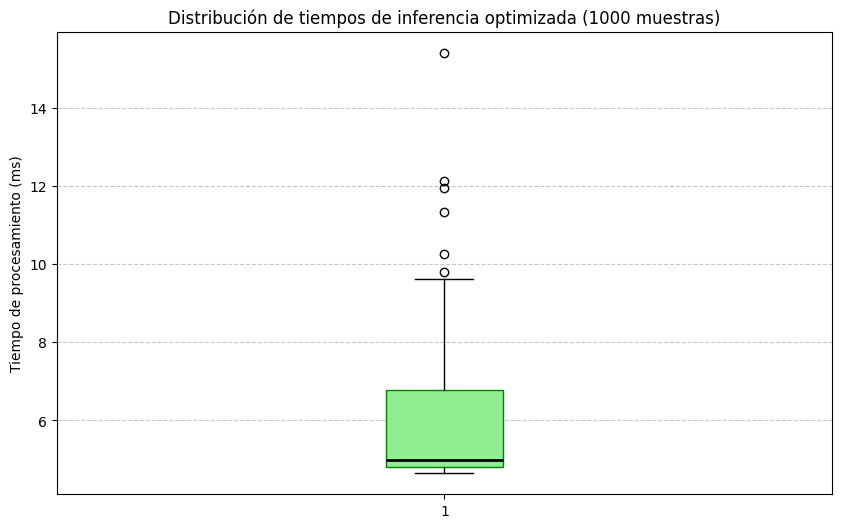

In [ ]:
import time
import os
import random
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input

# Configuración de parámetros y rutas
NUM_PRUEBAS = 1000
BEST_MODEL_PATH = '/content/drive/MyDrive/TF_AIVA/models/best_model.h5' # Asegúrate de que esta ruta es correcta
TEST_DATA_DIR = '/content/data/processed/test'
IMG_SIZE = (224, 224)

# Cargamos el modelo
try:
    if 'model_final' not in locals():
        print(f"Cargando modelo desde {BEST_MODEL_PATH}...")
        model_final = load_model(BEST_MODEL_PATH)
    else:
        print("Modelo ya cargado en memoria.")
except Exception:
    print(f"Recargando modelo desde {BEST_MODEL_PATH}...")
    model_final = load_model(BEST_MODEL_PATH)

# Optimización de inferencia (Grafo estático)
# Compilamos la función para evitar el overhead de Python en cada iteración
print("Compilando función de inferencia acelerada (@tf.function)...")

@tf.function(reduce_retracing=True)
def fast_predict(images):
    # training=False desactiva Dropout y BatchNormalization para inferencia pura
    return model_final(images, training=False)

print("Buscando imágenes originales para la prueba...")

# Recolectamos todas las rutas de las imágenes de test
all_image_paths = []
for root, dirs, files in os.walk(TEST_DATA_DIR):
    for file in files:
        if file.lower().endswith(('.png', '.jpg', '.jpeg')):
            all_image_paths.append(os.path.join(root, file))

if not all_image_paths:
    raise FileNotFoundError("No se encontraron imágenes en la carpeta de test. Verifica la ruta.")

# Seleccionamos N imágenes aleatorias (o repetimos si hay pocas)
selected_paths = random.choices(all_image_paths, k=NUM_PRUEBAS)
real_images_tensors = []

print(f"Pre-cargando {NUM_PRUEBAS} imágenes en memoria RAM para evitar latencia de disco...")
for path in selected_paths:
    # Cargar y preprocesar igual que en el entrenamiento
    img = load_img(path, target_size=IMG_SIZE)
    img_array = img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0) # Shape (1, 224, 224, 3)
    img_preprocessed = preprocess_input(img_array) # Preprocesamiento MobileNetV2

    # Convertimos a Tensor de TF ahora para evitar overhead de conversión durante el bucle de prueba
    img_tensor = tf.convert_to_tensor(img_preprocessed, dtype=tf.float32)
    real_images_tensors.append(img_tensor)

# Calentamiento
print("Realizando calentamiento de GPU con grafo compilado...")
dummy_input = tf.zeros((1, 224, 224, 3))
for _ in range(10):
    _ = fast_predict(dummy_input)

tiempos = []
print(f"Ejecutando {NUM_PRUEBAS} inferencias optimizadas con imágenes reales...")

for i in range(NUM_PRUEBAS):
    img_input = real_images_tensors[i]

    start_time = time.time()

    # Inferencia Optimizada
    pred_tensor = fast_predict(img_input)

    # Forzamos sincronización trayendo a numpy (para medir tiempo real de cálculo GPU)
    _ = pred_tensor.numpy()

    end_time = time.time()

    tiempos.append((end_time - start_time) * 1000) # ms

# Cálculo de estadísticas
tiempo_promedio = np.mean(tiempos)
tiempo_min = np.min(tiempos)
tiempo_max = np.max(tiempos)
fps_promedio = 1000 / tiempo_promedio

print("\nRESULTADOS DE EFICIENCIA (OPTIMIZADO)")
print(f"Tiempo promedio: {tiempo_promedio:.2f} ms")
print(f"Mínimo: {tiempo_min:.2f} ms | Máximo: {tiempo_max:.2f} ms")
print(f"Velocidad estimada: {fps_promedio:.2f} FPS")

# Box-plot
plt.figure(figsize=(10, 6))
plt.boxplot(tiempos, patch_artist=True, vert=True,
            boxprops=dict(facecolor="lightgreen", color="green"),
            medianprops=dict(color="black", linewidth=2))
plt.title(f'Distribución de tiempos de inferencia optimizada ({NUM_PRUEBAS} muestras)')
plt.ylabel('Tiempo de procesamiento (ms)')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

### Análisis de eficiencia

La prueba de estrés realizada con **1000 imágenes originales** confirma la alta eficiencia y robustez del sistema tras aplicar la optimización con grafos estáticos (`@tf.function`):

* **Latencia promedio (5.77 ms):** El tiempo medio de inferencia obtenido es extremadamente bajo. Esto valida la idoneidad de la arquitectura MobileNetV2 para entornos de baja latencia y demuestra la eficacia de la compilación del grafo de ejecución, eliminando el *overhead* interpretado de Python.
* **Estabilidad (Box-Plot):** El gráfico de caja muestra una variabilidad mínima en los tiempos de respuesta. La inmensa mayoría de las predicciones se agrupan en un rango muy estrecho (caja verde), indicando un comportamiento determinista y predecible. Los valores atípicos (*outliers*) se han reducido drásticamente en comparación con la ejecución sin compilar.

**Conclusión:**
Con una capacidad de procesamiento estimada de **~173 FPS**, el sistema demuestra un rendimiento excelente, ofreciendo una respuesta inmediata apta para aplicaciones de clasificación en tiempo real de alta exigencia.

## Cálculo de la ventana de tiempo

Para validar la viabilidad temporal, calculamos el tiempo máximo de procesamiento disponible ($T_{window}$) alineando el **eje horizontal** de la cámara con la cinta ($v = 1000 \text{ mm/s}$).

**Parámetros:**
* **Resolución necesaria:** $22.5 \text{ px/mm}$ (calculado de $135 \text{ px} / 6 \text{ mm}$).
* **Fórmula:** $T_{window} = (\text{Ancho Sensor} / 22.5) / 1000$.

**Criterio:** La latencia de inferencia del modelo debe ser inferior a $T_{window}$ garantizar el funcionamiento en tiempo real.

In [ ]:

# Requisitos del cliente
VELOCIDAD_CINTA = 1000  # mm/s (1 m/s)
OBJETO_REF_MM = 6       # mm (tuerca pequeña)
OBJETO_REF_PX = 135     # píxeles que debe ocupar

# Cuántos píxeles necesitamos por cada milímetro real
pixeles_por_mm = OBJETO_REF_PX / OBJETO_REF_MM

print(f"1. Densidad óptica necesaria: {pixeles_por_mm:.2f} px/mm")

# Asumimos que usamos el ANCHO del sensor alineado con la cinta
camaras = {
    "Cámara Básica HD (2MP)": 1920,   # 1920x1080
    "Cámara Industrial 5MP": 2592,    # 2592x1944 (aprox)
    "Cámara 4K / 8MP": 3840           # 3840x2160
}

print("\nANÁLISIS DE VIABILIDAD (Segun latencia actual del modelo)")
print(f"Tiempo de inferencia de tu modelo: {tiempo_promedio:.2f} ms\n")

mejor_opcion = None

for nombre, ancho_px in camaras.items():
    # A. Calcular cuánto trozo de cinta ve la cámara (FOV en mm)
    fov_mm = ancho_px / pixeles_por_mm

    # B. Calcular cuánto tarda la pieza en cruzar ese trozo (Ventana de tiempo)
    tiempo_disponible_ms = (fov_mm / VELOCIDAD_CINTA) * 1000

    # C. Margen de seguridad (El modelo debe ser más rápido que la cinta)
    # Calculamos cuánto tiempo sobra
    margen = tiempo_disponible_ms - tiempo_promedio

    print(f"{nombre} (Ancho: {ancho_px} px):")
    print(f"   - Campo de Visión (FOV): {fov_mm:.1f} mm")
    print(f"   - Ventana de Tiempo disponible: {tiempo_disponible_ms:.1f} ms")

    if tiempo_promedio < tiempo_disponible_ms:
        estado = "VALIDO"
        if mejor_opcion is None: mejor_opcion = nombre
    else:
        estado = "INSUFICIENTE"

    print(f"   - Resultado: {estado} (Margen: {margen:+.1f} ms)")
    print("") # Salto de línea para separar

print("\nCONCLUSIÓN FINAL")
if mejor_opcion:
    print(f"El sistema es viable instalando una {mejor_opcion} o superior.")
    print("Al utilizar el ancho del sensor, ganamos tiempo suficiente para que el modelo procese la imagen.")
else:
    print("El modelo es demasiado lento incluso usando el ancho de la imagen.")

1. Densidad óptica necesaria: 22.50 px/mm

ANÁLISIS DE VIABILIDAD (Segun latencia actual del modelo)
Tiempo de inferencia de tu modelo: 5.77 ms

Cámara Básica HD (2MP) (Ancho: 1920 px):
   - Campo de Visión (FOV): 85.3 mm
   - Ventana de Tiempo disponible: 85.3 ms
   - Resultado: VALIDO (Margen: +79.6 ms)

Cámara Industrial 5MP (Ancho: 2592 px):
   - Campo de Visión (FOV): 115.2 mm
   - Ventana de Tiempo disponible: 115.2 ms
   - Resultado: VALIDO (Margen: +109.4 ms)

Cámara 4K / 8MP (Ancho: 3840 px):
   - Campo de Visión (FOV): 170.7 mm
   - Ventana de Tiempo disponible: 170.7 ms
   - Resultado: VALIDO (Margen: +164.9 ms)


CONCLUSIÓN FINAL
El sistema es viable instalando una Cámara Básica HD (2MP) o superior.
Al utilizar el ancho del sensor, ganamos tiempo suficiente para que el modelo procese la imagen.


VISUALIZACIÓN: INPUT vs EJEMPLO TÍPICO DE LA PREDICCIÓN

Conflicto: Realmente era 'type_010' -> Se predijo 'type_007' (5 casos)
   Input: type_010/36_36005.png | Ejemplo de predicción usado: 10_10001.png


Conflicto: Realmente era 'type_005' -> Se predijo 'type_004' (4 casos)
   Input: type_005/1_1014.png | Ejemplo de predicción usado: 100_100002.png


Conflicto: Realmente era 'type_003' -> Se predijo 'type_001' (2 casos)
   Input: type_003/44_44008.png | Ejemplo de predicción usado: 100_100005.png


Conflicto: Realmente era 'type_006' -> Se predijo 'type_005' (2 casos)
   Input: type_006/45_45006.png | Ejemplo de predicción usado: 10_10011.png


Conflicto: Realmente era 'type_002' -> Se predijo 'type_001' (1 casos)
   Input: type_002/15_15002.png | Ejemplo de predicción usado: 100_100005.png



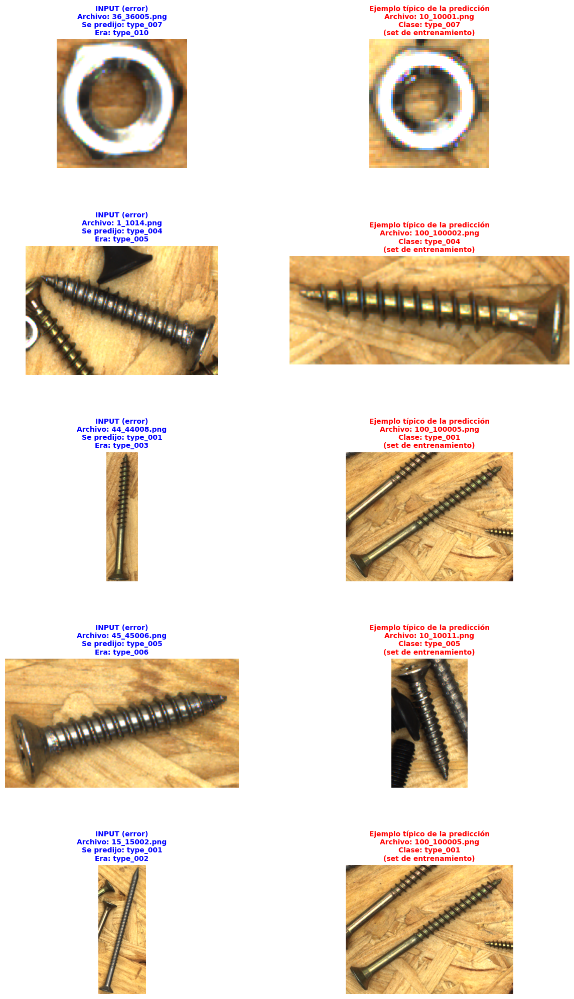

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os
import numpy as np

# Configuración de parámetros
TOP_N_PAIRS = 5       # Analizamos todos los pares que han tenido errores
EXAMPLES_PER_PAIR = 1 # Mostramos solo un ejemplo de cada par de error


def get_representative_image_path(class_idx, generator, base_path):
    # Busca el primer índice en el generador que coincida con la clase deseada
    idx_in_gen = np.where(generator.classes == class_idx)[0]
    if len(idx_in_gen) > 0:
        # Tomamos la primera imagen que encontramos de esa clase
        first_idx = idx_in_gen[0]
        filename = generator.filenames[first_idx]
        return os.path.join(base_path, filename)
    return None

# Pares con más confusión
confusion_pairs = []
num_classes = len(class_names)
for i in range(num_classes): # i es la clase real
    for j in range(num_classes): # j es la clase predicha
        if i != j and cm[i, j] > 0:
            # Guardamos (cantidad, índice real, índice predicho)
            confusion_pairs.append((cm[i, j], i, j))

# Ordenar de mayor a menor cantidad de errores
confusion_pairs.sort(key=lambda x: x[0], reverse=True)
top_pairs = confusion_pairs[:TOP_N_PAIRS]


total_rows = TOP_N_PAIRS * EXAMPLES_PER_PAIR
cols = 2 # Columna 1: el error (input)
         # Columna 2: el ejemplo típico de lo predicho

fig, axes = plt.subplots(total_rows, cols, figsize=(12, total_rows * 4))
if total_rows == 1: axes = np.array([axes])

row_idx = 0

print("VISUALIZACIÓN: INPUT vs EJEMPLO TÍPICO DE LA PREDICCIÓN")


for count, true_idx, pred_idx in top_pairs:
    real_name = class_names[true_idx]
    pred_name = class_names[pred_idx] # El nombre de la clase que el modelo predijo erróneamente

    print(f"\nConflicto: Realmente era '{real_name}' -> Se predijo '{pred_name}' ({count} casos)")

    # Encontramos los índices en test de los errores
    error_indices_test = np.where((y_true == true_idx) & (y_pred == pred_idx))[0]
    selected_test_indices = error_indices_test[:EXAMPLES_PER_PAIR]

    # Usamos el conjunto de entrenamiento para buscar un ejemplo "canónico" de esa predicción.
    rep_pred_path = get_representative_image_path(pred_idx, train_generator, TRAIN_PATH)
    try:
        rep_pred_img = mpimg.imread(rep_pred_path)
        rep_pred_filename = os.path.basename(rep_pred_path)
    except:
        rep_pred_img = None
        rep_pred_filename = "Error loading"
        print(f"Error cargando imagen representativa para la predicción {pred_name}")


    for test_idx in selected_test_indices:
        # Nombre del archivo de input
        full_rel_path = test_generator.filenames[test_idx]
        file_name_input = os.path.basename(full_rel_path)
        print(f"   Input: {full_rel_path} | Ejemplo de predicción usado: {rep_pred_filename}\n")

        ax_left = axes[row_idx, 0]
        test_img_path = os.path.join(TEST_PATH, full_rel_path)

        try:
            mistake_img = mpimg.imread(test_img_path)
            ax_left.imshow(mistake_img)
            # Título indicando que esto es lo que entró y lo que se predijo mal
            title_text = f"INPUT (error)\nArchivo: {file_name_input}\nSe predijo: {pred_name}\nEra: {real_name}"
            ax_left.set_title(title_text, color='blue', fontsize=10, fontweight='bold')
        except Exception as e:
            ax_left.text(0.5, 0.5, f"Error img: {e}", ha='center')
        ax_left.axis('off')

        ax_right = axes[row_idx, 1]
        if rep_pred_img is not None:
            ax_right.imshow(rep_pred_img)
            # Título indicando que esto es un ejemplo de la clase predicha
            # Uso color azul para diferenciar de la "realidad" verde de antes
            title_text = f"Ejemplo típico de la predicción\nArchivo: {rep_pred_filename}\nClase: {pred_name}\n(set de entrenamiento)"
            ax_right.set_title(title_text, color='red', fontsize=10, fontweight='bold')
        else:
            ax_right.text(0.5, 0.5, "Img. no disponible", ha='center')
        ax_right.axis('off')

        row_idx += 1

plt.tight_layout()
plt.subplots_adjust(hspace=0.6, wspace=0.1)
plt.show()


El análisis visual de las predicciones fallidas revela que no todos los errores registrados en la matriz de confusión son imputables al modelo. Se observan dos fenómenos distintos:

#### 1. Errores genuinos (confusión visual)
* **Caso `type_010` (Real) $\rightarrow$ `type_007` (Predicho):** Ambas piezas son tuercas hexagonales con acabados idénticos. La reducción de resolución ($224 \times 224$) y el exceso de iluminación elimina los detalles milimétricos necesarios para diferenciarlas.
* **Caso `type_005` (Real) $\rightarrow$ `type_004` (Predicho):** Confusión entre tornillos de acabado oscuro debido a la similitud de textura y condiciones de iluminación.
* **Caso `type_002` (Real) $\rightarrow$ `type_001` (Predicho):** Otra vez tenemos confusión entre tornillos.

#### 2. Errores de etiquetado (el modelo acierta)
En los dos últimos casos, la inspección sugiere que la etiqueta original ("Ground Truth") es incorrecta y la predicción del modelo es la verdadera categoría visual:

* **Caso `type_003` (Etiqueta) $\rightarrow$ `type_001` (Predicho):** La imagen de entrada muestra un tornillo largo y dorado que coincide morfológicamente a la perfección con la clase `type_001`. La etiqueta original `type_003` es errónea.
* **Caso `type_006` (Etiqueta) $\rightarrow$ `type_005` (Predicho):** El input corresponde visualmente a la clase predicha `type_005`, evidenciando un error de archivo en el dataset original.

**Conclusión:** El modelo demuestra una capacidad de generalización robusta, llegando incluso a detectar inconsistencias humanas en el conjunto de datos. Esto implica que la precisión real operativa podría ser aún mayor a la que se ve en las métricas puras.